In [1]:
import sys, os

import warnings
warnings.filterwarnings('ignore')

# Usual Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import sklearn
from sklearn.model_selection import train_test_split

# Librosa (the mother of audio files)
import librosa
import librosa.display
import IPython.display as ipd

from PIL import Image
from tensorflow.keras import preprocessing
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Conv2D,UpSampling2D,Dropout,Dense,Flatten,Conv2DTranspose,BatchNormalization,LeakyReLU,Reshape,ZeroPadding2D,Input,Activation
import tensorflow as tf

## Loading and pre-processing audio data:

In [2]:
general_songs_path = r'C:\Users\weldl\Datasets\gtzan-dataset-music-genre-classification'
genres_list = os.listdir(f'{general_songs_path}/genres_original/')
print(genres_list)

['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']


In [3]:
all_songs = []
for genre in genres_list:
    for song_name in os.listdir(os.path.join(f'{general_songs_path}/genres_original/', genre)):
        all_songs.append(os.path.join(f'{general_songs_path}/genres_original/', genre, song_name))
print('all_songs:', len(all_songs))

all_songs: 1000


In [4]:
def get_spectogram_data(songs_array):
    spec_array = []
    for song_name in songs_array:
        y, sr = librosa.load(song_name)
        y, _ = librosa.effects.trim(y)
        S = librosa.feature.melspectrogram(y, sr=sr)
        S_DB = (librosa.amplitude_to_db(S, ref=np.max)+80)/80
        try:
            spec_array.append(S_DB[:, 0:1210].reshape((128, 1210, 1)))
        except ValueError:
            print(S_DB.shape)
    return np.array(spec_array)

spec_data = get_spectogram_data(all_songs[:])
print(spec_data[0].min(), spec_data[0].max())
spec_data.shape

0.0 1.0


(1000, 128, 1210, 1)

In [5]:
SPEC_SHAPE = spec_data.shape[1:]

In [6]:
spec_data_train, spec_data_test = train_test_split(spec_data, test_size=0.1, random_state=42)

print('train samples:', spec_data_train.shape)
print('test samples:', spec_data_test.shape)

train samples: (900, 128, 1210, 1)
test samples: (100, 128, 1210, 1)


## Loading and pre-processing images:

In [7]:
general_imgs_path = r'C:\Users\weldl\Datasets\Album Covers Images'

for dirname, _, filenames in os.walk(general_imgs_path):
    for filename in filenames:
        print(os.path.join(dirname, filename))

C:\Users\weldl\Datasets\Album Covers Images\0.jpg
C:\Users\weldl\Datasets\Album Covers Images\1.jpg
C:\Users\weldl\Datasets\Album Covers Images\10.jpg
C:\Users\weldl\Datasets\Album Covers Images\100.jpg
C:\Users\weldl\Datasets\Album Covers Images\1000.jpg
C:\Users\weldl\Datasets\Album Covers Images\10000.jpg
C:\Users\weldl\Datasets\Album Covers Images\10001.jpg
C:\Users\weldl\Datasets\Album Covers Images\10002.jpg
C:\Users\weldl\Datasets\Album Covers Images\10003.jpg
C:\Users\weldl\Datasets\Album Covers Images\10004.jpg
C:\Users\weldl\Datasets\Album Covers Images\10005.jpg
C:\Users\weldl\Datasets\Album Covers Images\10006.jpg
C:\Users\weldl\Datasets\Album Covers Images\10007.jpg
C:\Users\weldl\Datasets\Album Covers Images\10008.jpg
C:\Users\weldl\Datasets\Album Covers Images\10009.jpg
C:\Users\weldl\Datasets\Album Covers Images\1001.jpg
C:\Users\weldl\Datasets\Album Covers Images\10010.jpg
C:\Users\weldl\Datasets\Album Covers Images\10011.jpg
C:\Users\weldl\Datasets\Album Covers Images

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




C:\Users\weldl\Datasets\Album Covers Images\65709.jpg
C:\Users\weldl\Datasets\Album Covers Images\6571.jpg
C:\Users\weldl\Datasets\Album Covers Images\65710.jpg
C:\Users\weldl\Datasets\Album Covers Images\65711.jpg
C:\Users\weldl\Datasets\Album Covers Images\65712.jpg
C:\Users\weldl\Datasets\Album Covers Images\65713.jpg
C:\Users\weldl\Datasets\Album Covers Images\65714.jpg
C:\Users\weldl\Datasets\Album Covers Images\65715.jpg
C:\Users\weldl\Datasets\Album Covers Images\65716.jpg
C:\Users\weldl\Datasets\Album Covers Images\65717.jpg
C:\Users\weldl\Datasets\Album Covers Images\65718.jpg
C:\Users\weldl\Datasets\Album Covers Images\65719.jpg
C:\Users\weldl\Datasets\Album Covers Images\6572.jpg
C:\Users\weldl\Datasets\Album Covers Images\65720.jpg
C:\Users\weldl\Datasets\Album Covers Images\65721.jpg
C:\Users\weldl\Datasets\Album Covers Images\65722.jpg
C:\Users\weldl\Datasets\Album Covers Images\65723.jpg
C:\Users\weldl\Datasets\Album Covers Images\65724.jpg
C:\Users\weldl\Datasets\Album

In [8]:
imgs_paths = []
for path in os.listdir(general_imgs_path):
    if '.jpg' in path:
        imgs_paths.append(os.path.join(general_imgs_path, path))

In [9]:
imgs_paths_train = imgs_paths[0:50000]
len(imgs_paths_train)

50000

In [10]:
IMG_SHAPE = (64, 64)

# crop = (30, 55, 150, 175) #croping size for the image so that only the face at centre is obtained
# images = [np.array((Image.open(path).crop(crop)).resize((64,64))) for path in new_path]
images = [np.array(Image.open(path).resize(IMG_SHAPE)) for path in imgs_paths_train]

for i in range(len(images)):
#     images[i] = ((images[i] - images[i].min())/(255 - images[i].min()))
    images[i] = ((images[i] - 127.5)/127.5)
    #images[i] = images[i]*2-1  #uncomment this if activation is tanh for generator last layer

images = np.array(images)
print(images.min(), images.max())

-1.0 1.0


In [11]:
train_data=images
train_data.shape

(50000, 64, 64, 3)

In [12]:
IMG_SHAPE = train_data.shape[1:]
IMG_SHAPE

(64, 64, 3)

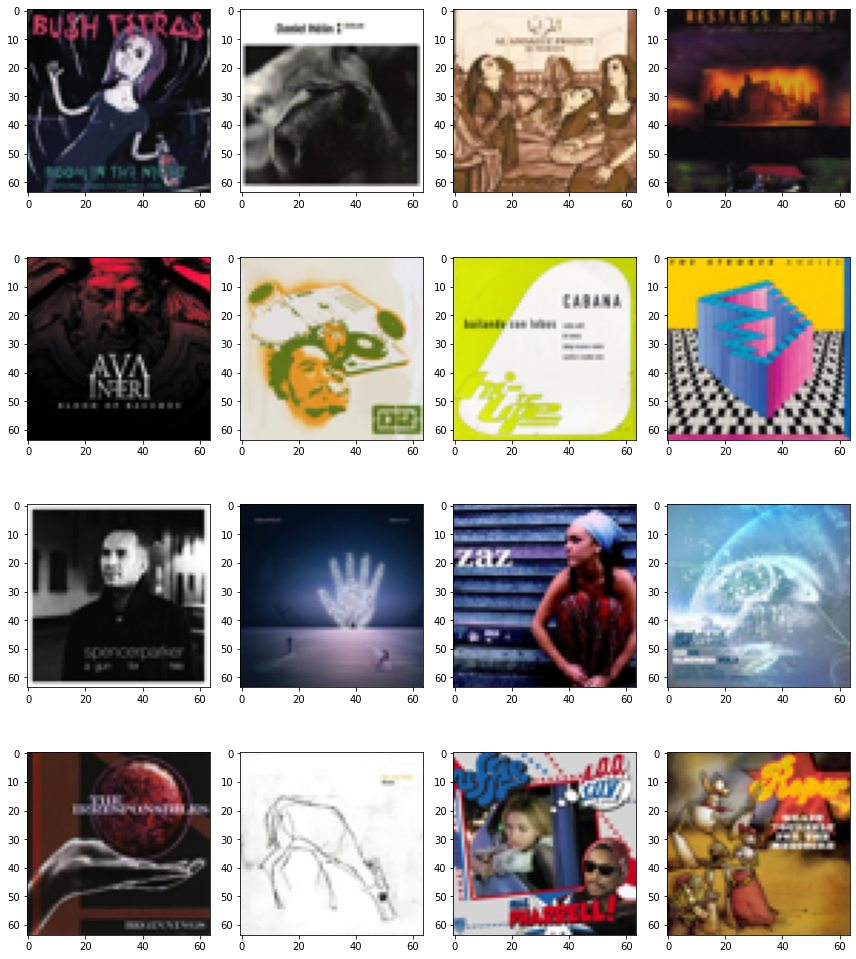

In [13]:
# Images Visualization:
   
def plot_img_samples(img_array, figsize=(12, 14), title=None, subplot_dim=(4, 4)):
    plt.figure(figsize=figsize)
    if title:
        plt.title(title)
    idx=0
    for i in range(subplot_dim[0]):
        for j in range(subplot_dim[1]):
                plt.subplot(subplot_dim[0], subplot_dim[1], i*4 + j +1)
                img_array_ = (img_array[idx]+1) * 127.5
                plt.imshow(img_array_.astype(int))
                idx+=1
    plt.tight_layout()
    plt.show()

plot_img_samples(train_data)

In [14]:
X_train = train_data
X_train.shape

(50000, 64, 64, 3)

# **Generator**

In [15]:
noise_shape = 100

In [16]:
# def make_encoder_model(input_shape=(64,64, 3), output_len=100):
#     encoder = Sequential()
#     encoder.add(Conv2D(32, (3,3), strides=(2, 2), padding='same', input_shape=input_shape))
#     encoder.add(Conv2D(16, (3,3), strides=(2, 2), padding='same'))
#     encoder.add(Conv2D(16, (3,3), strides=(2, 2), padding='same'))
#     encoder.add(Conv2D(8, (3,3), strides=(2, 2), padding='same'))
#     encoder.add(Flatten())
#     encoder.add(Dropout(0.3))
#     encoder.add(Dense(256))
#     encoder.add(Dense(output_len))
#     return encoder

# encoder = make_encoder_model(input_shape=SPEC_SHAPE, output_len=noise_shape)
# encoder.summary()

In [17]:
def make_encoder_model(input_shape=(64,64, 3), output_len=100):
    encoder = Sequential()
    encoder.add(Conv2D(32, (3,3), strides=(2, 2), padding='same', input_shape=input_shape))
    encoder.add(layers.BatchNormalization())
    encoder.add(Dropout(0.3))
    encoder.add(Conv2D(16, (3,3), strides=(2, 2), padding='same'))
    encoder.add(layers.BatchNormalization())
    encoder.add(Dropout(0.3))
    encoder.add(Conv2D(8, (3,3), strides=(2, 2), padding='same'))
    encoder.add(Flatten())
    encoder.add(layers.BatchNormalization())
    encoder.add(Dropout(0.3))
    encoder.add(Dense(output_len))
    return encoder

encoder = make_encoder_model(input_shape=SPEC_SHAPE, output_len=noise_shape)
encoder.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 64, 605, 32)       320       
_________________________________________________________________
batch_normalization (BatchNo (None, 64, 605, 32)       128       
_________________________________________________________________
dropout (Dropout)            (None, 64, 605, 32)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 32, 303, 16)       4624      
_________________________________________________________________
batch_normalization_1 (Batch (None, 32, 303, 16)       64        
_________________________________________________________________
dropout_1 (Dropout)          (None, 32, 303, 16)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 16, 152, 8)        1

In [18]:
samples = np.array(encoder(spec_data[0:2]))
print(samples.min(), samples.max())

-0.2172193 0.29936066


In [19]:
def build_generator(noise_size, channels):
    GENERATE_RES=2
    model = Sequential()
    model.add(Dense(4 * 4 * 256, activation="relu", input_dim=noise_size))
    model.add(Reshape((4, 4, 256)))
    model.add(UpSampling2D())
    model.add(Conv2D(256, kernel_size=3, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))
    model.add(UpSampling2D())
    model.add(Conv2D(256, kernel_size=3, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))
    for i in range(GENERATE_RES):
         model.add(UpSampling2D())
         model.add(Conv2D(256, kernel_size=3, padding="same"))
         model.add(BatchNormalization(momentum=0.8))
         model.add(Activation("relu"))
#     model.summary()
    model.add(Conv2D(channels, kernel_size=3, padding="same"))
    model.add(Activation('tanh'))
#     input = Input(shape=(noise_size,))
#     generated_image = model(input)
    
    return model

generator_ = build_generator(noise_shape, channels=IMG_SHAPE[-1])
generator_.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 4096)              413696    
_________________________________________________________________
reshape (Reshape)            (None, 4, 4, 256)         0         
_________________________________________________________________
up_sampling2d (UpSampling2D) (None, 8, 8, 256)         0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 8, 8, 256)         590080    
_________________________________________________________________
batch_normalization_3 (Batch (None, 8, 8, 256)         1024      
_________________________________________________________________
activation (Activation)      (None, 8, 8, 256)         0         
_________________________________________________________________
up_sampling2d_1 (UpSampling2 (None, 16, 16, 256)      

In [20]:
# Adding the encoder to the model:
generator = Sequential([encoder, generator_])
generator.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential (Sequential)      (None, 100)               2029820   
_________________________________________________________________
sequential_1 (Sequential)    (None, 64, 64, 3)         2785027   
Total params: 4,814,847
Trainable params: 4,773,791
Non-trainable params: 41,056
_________________________________________________________________


# **Discriminator**

In [21]:
def build_discriminator(input_shape):
    model = Sequential()
    model.add(Conv2D(64, (3,3), strides=(2, 2), padding='same', input_shape=input_shape))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.4))
    model.add(Conv2D(32, (3,3), strides=(2, 2), padding='same', input_shape=input_shape))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.4))
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))
    return model

discriminator = build_discriminator(IMG_SHAPE)
discriminator.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (None, 32, 32, 64)        1792      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 32, 32, 64)        0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 16, 16, 32)        18464     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 16, 16, 32)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 16, 16, 32)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 8192)             

# **DCGAN (combined model)**

In [22]:
GAN = Sequential([generator,discriminator])

In [23]:
discriminator.compile(optimizer='adam',loss='binary_crossentropy')
discriminator.trainable = False

In [24]:
GAN.compile(optimizer='adam',loss='binary_crossentropy')

In [25]:
GAN.layers

In [26]:
GAN.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_2 (Sequential)    (None, 64, 64, 3)         4814847   
_________________________________________________________________
sequential_3 (Sequential)    (None, 1)                 28449     
Total params: 4,843,296
Trainable params: 4,773,791
Non-trainable params: 69,505
_________________________________________________________________


# **Training**

In [27]:
epochs = 100  #set epoch according to your training dataset size,i had chosen 50k images hence epochs are high as 300...
batch_size = 64

In [28]:
D_loss=[] #list to collect loss for the discriminator model
G_loss=[] #list to collect loss for generator model

Currently on Epoch 1
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781


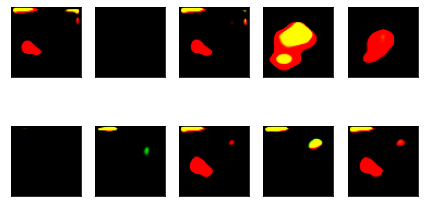

Epoch: 1,  Loss: D_real = 0.050, D_fake = 0.017,  G = 3.773
Currently on Epoch 2
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 2,  Loss: D_real = 0.582, D_fake = 0.203,  G = 10.881
Currently on Epoch 3
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 3,  Loss: D_real = 0.005, D_fake = 0.008,  G = 3.913
Currently on Epoch 4
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	C

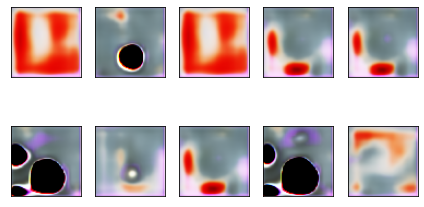

Epoch: 6,  Loss: D_real = 0.407, D_fake = 0.141,  G = 2.468
Currently on Epoch 7
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 7,  Loss: D_real = 0.615, D_fake = 0.097,  G = 4.858
Currently on Epoch 8
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 8,  Loss: D_real = 0.054, D_fake = 0.009,  G = 0.022
Currently on Epoch 9
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Cu

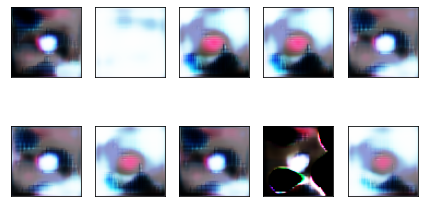

Epoch: 11,  Loss: D_real = 0.400, D_fake = 0.436,  G = 3.578
Currently on Epoch 12
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 12,  Loss: D_real = 0.769, D_fake = 0.255,  G = 2.314
Currently on Epoch 13
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 13,  Loss: D_real = 0.314, D_fake = 0.212,  G = 2.842
Currently on Epoch 14
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 7

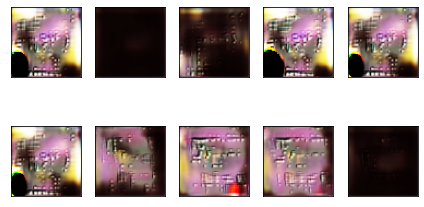

Epoch: 16,  Loss: D_real = 0.611, D_fake = 0.371,  G = 2.469
Currently on Epoch 17
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 17,  Loss: D_real = 0.708, D_fake = 0.158,  G = 3.389
Currently on Epoch 18
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 18,  Loss: D_real = 0.098, D_fake = 0.047,  G = 7.723
Currently on Epoch 19
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 7

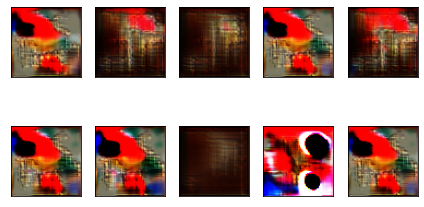

Epoch: 21,  Loss: D_real = 0.188, D_fake = 0.127,  G = 3.750
Currently on Epoch 22
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 22,  Loss: D_real = 0.594, D_fake = 0.242,  G = 3.116
Currently on Epoch 23
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 23,  Loss: D_real = 0.662, D_fake = 0.165,  G = 4.075
Currently on Epoch 24
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 7

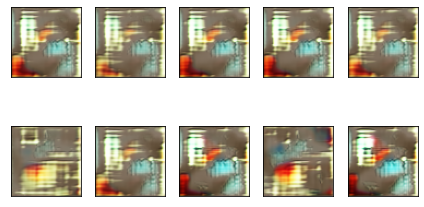

Epoch: 26,  Loss: D_real = 0.748, D_fake = 0.187,  G = 1.953
Currently on Epoch 27
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 27,  Loss: D_real = 0.242, D_fake = 0.071,  G = 6.048
Currently on Epoch 28
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 28,  Loss: D_real = 0.109, D_fake = 0.110,  G = 1.890
Currently on Epoch 29
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 7

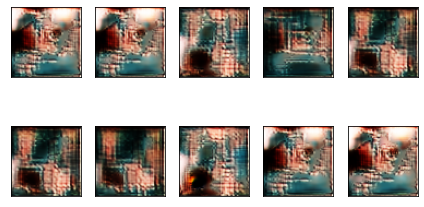

Epoch: 31,  Loss: D_real = 0.323, D_fake = 0.382,  G = 2.171
Currently on Epoch 32
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 32,  Loss: D_real = 0.839, D_fake = 0.302,  G = 4.310
Currently on Epoch 33
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 33,  Loss: D_real = 0.159, D_fake = 0.246,  G = 0.269
Currently on Epoch 34
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 7

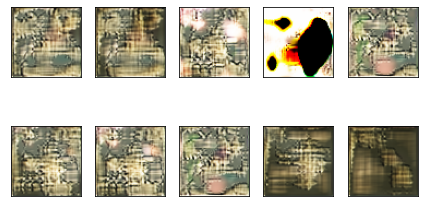

Epoch: 36,  Loss: D_real = 0.660, D_fake = 0.835,  G = 1.551
Currently on Epoch 37
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 37,  Loss: D_real = 1.220, D_fake = 0.509,  G = 1.705
Currently on Epoch 38
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 38,  Loss: D_real = 0.506, D_fake = 0.275,  G = 2.238
Currently on Epoch 39
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 7

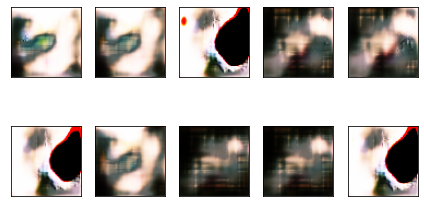

Epoch: 41,  Loss: D_real = 0.302, D_fake = 0.179,  G = 2.618
Currently on Epoch 42
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 42,  Loss: D_real = 0.856, D_fake = 0.459,  G = 1.281
Currently on Epoch 43
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 43,  Loss: D_real = 0.306, D_fake = 0.478,  G = 1.051
Currently on Epoch 44
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 7

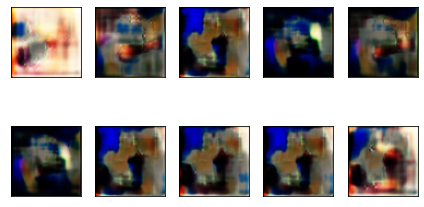

Epoch: 46,  Loss: D_real = 0.633, D_fake = 0.305,  G = 2.189
Currently on Epoch 47
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 47,  Loss: D_real = 0.315, D_fake = 0.325,  G = 2.058
Currently on Epoch 48
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 48,  Loss: D_real = 0.027, D_fake = 0.028,  G = 9.646
Currently on Epoch 49
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 7

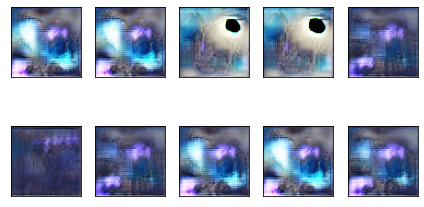

Epoch: 51,  Loss: D_real = 0.148, D_fake = 0.130,  G = 3.218
Currently on Epoch 52
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 52,  Loss: D_real = 0.714, D_fake = 0.333,  G = 2.227
Currently on Epoch 53
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 53,  Loss: D_real = 0.324, D_fake = 0.218,  G = 3.712
Currently on Epoch 54
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 7

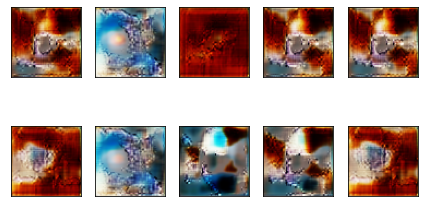

Epoch: 56,  Loss: D_real = 0.210, D_fake = 0.538,  G = 2.157
Currently on Epoch 57
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 57,  Loss: D_real = 0.277, D_fake = 0.116,  G = 3.388
Currently on Epoch 58
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 58,  Loss: D_real = 0.457, D_fake = 0.330,  G = 2.402
Currently on Epoch 59
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 7

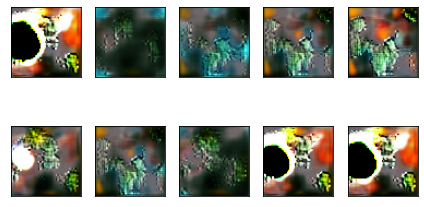

Epoch: 61,  Loss: D_real = 0.213, D_fake = 0.420,  G = 2.006
Currently on Epoch 62
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 62,  Loss: D_real = 0.244, D_fake = 0.269,  G = 1.840
Currently on Epoch 63
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 63,  Loss: D_real = 0.487, D_fake = 0.256,  G = 4.075
Currently on Epoch 64
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 7

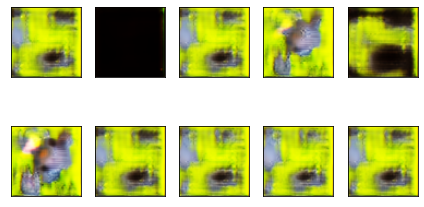

Epoch: 66,  Loss: D_real = 0.337, D_fake = 0.202,  G = 4.855
Currently on Epoch 67
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 67,  Loss: D_real = 0.492, D_fake = 0.174,  G = 1.711
Currently on Epoch 68
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 68,  Loss: D_real = 1.073, D_fake = 0.237,  G = 0.406
Currently on Epoch 69
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 7

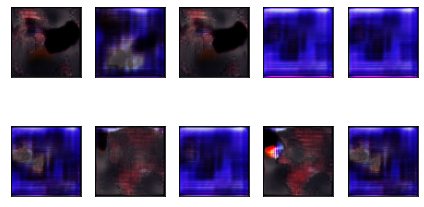

Epoch: 71,  Loss: D_real = 0.373, D_fake = 0.178,  G = 1.993
Currently on Epoch 72
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 72,  Loss: D_real = 0.673, D_fake = 0.374,  G = 0.591
Currently on Epoch 73
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 73,  Loss: D_real = 0.631, D_fake = 0.290,  G = 1.836
Currently on Epoch 74
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 7

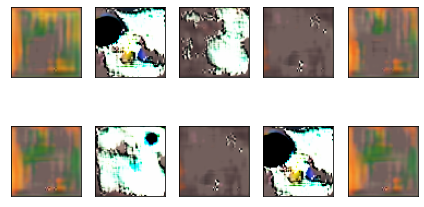

Epoch: 76,  Loss: D_real = 0.381, D_fake = 0.273,  G = 3.858
Currently on Epoch 77
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 77,  Loss: D_real = 0.440, D_fake = 0.257,  G = 2.241
Currently on Epoch 78
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 78,  Loss: D_real = 0.477, D_fake = 0.322,  G = 3.661
Currently on Epoch 79
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 7

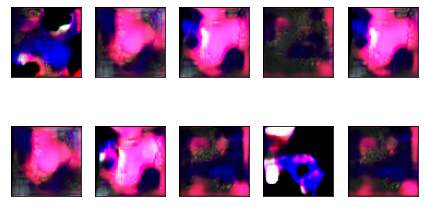

Epoch: 81,  Loss: D_real = 0.224, D_fake = 0.155,  G = 3.048
Currently on Epoch 82
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 82,  Loss: D_real = 0.274, D_fake = 0.192,  G = 3.368
Currently on Epoch 83
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 83,  Loss: D_real = 0.891, D_fake = 0.653,  G = 2.155
Currently on Epoch 84
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 7

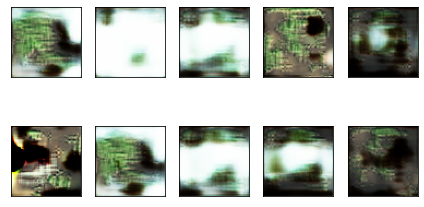

Epoch: 86,  Loss: D_real = 0.386, D_fake = 0.289,  G = 2.071
Currently on Epoch 87
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 87,  Loss: D_real = 0.442, D_fake = 0.230,  G = 2.330
Currently on Epoch 88
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 88,  Loss: D_real = 0.382, D_fake = 0.348,  G = 1.886
Currently on Epoch 89
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 7

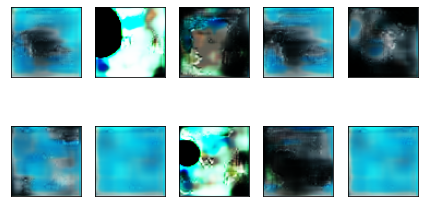

Epoch: 91,  Loss: D_real = 0.530, D_fake = 0.235,  G = 3.359
Currently on Epoch 92
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 92,  Loss: D_real = 0.488, D_fake = 0.106,  G = 3.460
Currently on Epoch 93
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 93,  Loss: D_real = 0.355, D_fake = 0.261,  G = 2.059
Currently on Epoch 94
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 7

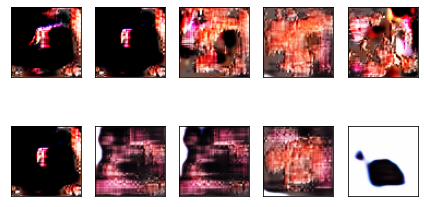

Epoch: 96,  Loss: D_real = 0.472, D_fake = 0.677,  G = 2.557
Currently on Epoch 97
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 97,  Loss: D_real = 0.391, D_fake = 0.629,  G = 3.610
Currently on Epoch 98
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 98,  Loss: D_real = 0.669, D_fake = 0.287,  G = 2.316
Currently on Epoch 99
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 7

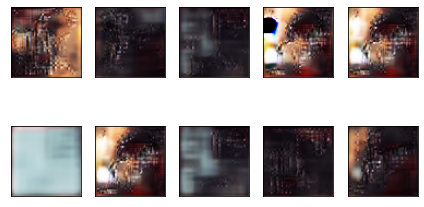

Epoch: 101,  Loss: D_real = 0.599, D_fake = 0.292,  G = 3.703
Currently on Epoch 102
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 102,  Loss: D_real = 0.445, D_fake = 0.344,  G = 2.574
Currently on Epoch 103
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 103,  Loss: D_real = 0.234, D_fake = 0.394,  G = 2.430
Currently on Epoch 104
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 30

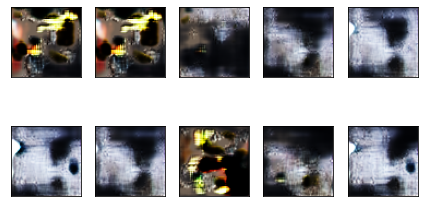

Epoch: 106,  Loss: D_real = 0.730, D_fake = 0.400,  G = 2.925
Currently on Epoch 107
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 107,  Loss: D_real = 0.522, D_fake = 0.417,  G = 2.148
Currently on Epoch 108
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 108,  Loss: D_real = 0.448, D_fake = 0.244,  G = 2.350
Currently on Epoch 109
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 30

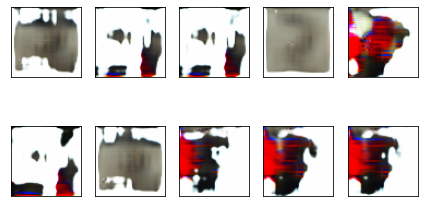

Epoch: 111,  Loss: D_real = 0.185, D_fake = 0.059,  G = 6.072
Currently on Epoch 112
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 112,  Loss: D_real = 0.413, D_fake = 0.262,  G = 2.746
Currently on Epoch 113
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 113,  Loss: D_real = 0.478, D_fake = 0.141,  G = 3.516
Currently on Epoch 114
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 30

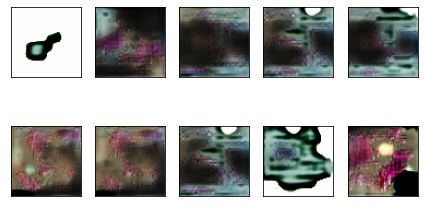

Epoch: 116,  Loss: D_real = 0.320, D_fake = 0.372,  G = 3.465
Currently on Epoch 117
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 117,  Loss: D_real = 0.247, D_fake = 0.154,  G = 3.099
Currently on Epoch 118
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 300 of 781
	Currently on batch number 400 of 781
	Currently on batch number 500 of 781
	Currently on batch number 600 of 781
	Currently on batch number 700 of 781
Epoch: 118,  Loss: D_real = 0.356, D_fake = 0.247,  G = 2.491
Currently on Epoch 119
	Currently on batch number 0 of 781
	Currently on batch number 100 of 781
	Currently on batch number 200 of 781
	Currently on batch number 30

KeyboardInterrupt: 

In [30]:
with tf.device('/gpu:0'):
 for epoch in range(epochs):
    print(f"Currently on Epoch {epoch+1}")
    
    # For every batch in the dataset
    for i in range(X_train.shape[0]//batch_size):
        
        if (i)%100 == 0:
            print(f"\tCurrently on batch number {i} of {len(X_train)//batch_size}")

        idxs = np.array([i for i in range(spec_data_train.shape[0])])
        idxs_select = np.random.choice(idxs, batch_size)
        img_noise = spec_data_train[idxs_select] + np.random.uniform(-0.1, 0.1,size=spec_data_train[idxs_select].shape)

        gen_image = generator.predict_on_batch(img_noise)
        
        train_dataset = X_train[i*batch_size:(i+1)*batch_size]
        #train on real image
        train_label=np.ones(shape=(batch_size,1))
        discriminator.trainable = True
        d_loss1 = discriminator.train_on_batch(train_dataset,train_label)
        
        #train on fake image
        train_label=np.zeros(shape=(batch_size,1))
        d_loss2 = discriminator.train_on_batch(gen_image,train_label)

        idxs = np.array([i for i in range(spec_data_train.shape[0])])
        idxs_select = np.random.choice(idxs, batch_size)
        img_noise = spec_data_train[idxs_select] + np.random.uniform(-0.1, 0.1,size=spec_data_train[idxs_select].shape)

        train_label=np.ones(shape=(batch_size,1))
        discriminator.trainable = False
        #train the generator
        g_loss = GAN.train_on_batch(img_noise, train_label)
        D_loss.append(d_loss1+d_loss2)
        G_loss.append(g_loss)
        
         
    if epoch % 5 == 0:
        samples = 10
#         test_samples = np.random.normal(loc=0, scale=1, size=(samples,100))        
        idxs = np.array([i for i in range(spec_data_test.shape[0])])
        idxs_select = np.random.choice(idxs, samples)
        test_samples = spec_data_test[idxs_select]
        x_fake = generator.predict(test_samples)

        for k in range(samples):
            plt.subplot(2, 5, k+1)
            img_array_ = (x_fake[k]+1) * 127.5
            plt.imshow(img_array_.astype(int))
            plt.xticks([])
            plt.yticks([])
        plt.tight_layout()
        plt.show()

    print('Epoch: %d,  Loss: D_real = %.3f, D_fake = %.3f,  G = %.3f' %   (epoch+1, d_loss1, d_loss2, g_loss))        
print('Training is complete')

# **Output Visualization**

In [31]:
noise = spec_data_test

In [32]:
im=generator.predict(noise)

In [33]:
im.shape[0]

100

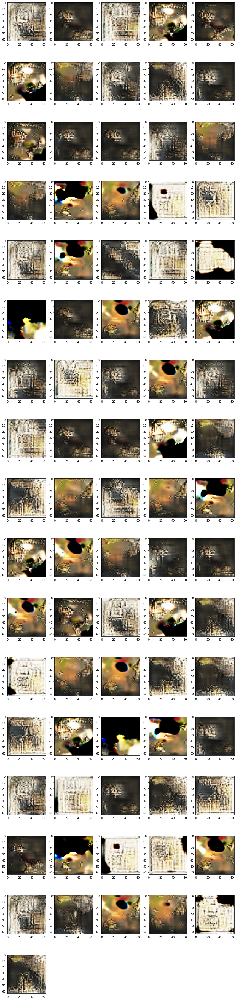

In [34]:
plot_img_samples(im, subplot_dim=(20, 5), figsize=(12, 60))

# **Loss Curve**

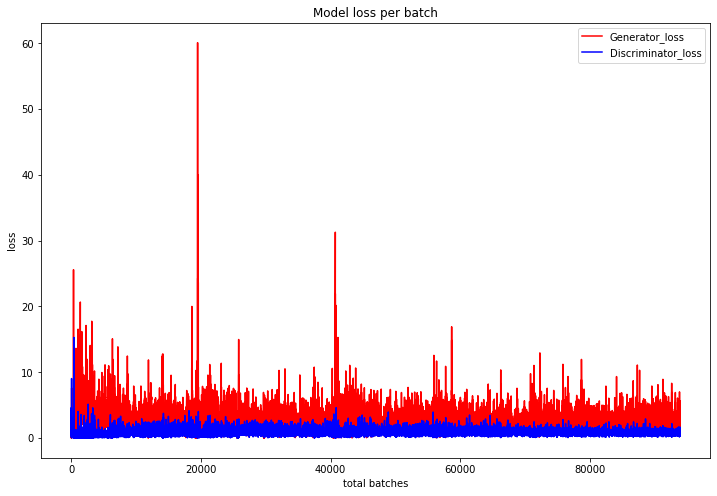

In [35]:
plt.figure(figsize=(12, 8))
plt.plot(G_loss,color='red',label='Generator_loss')
plt.plot(D_loss,color='blue',label='Discriminator_loss')
plt.legend()
plt.xlabel('total batches')
plt.ylabel('loss')
plt.title('Model loss per batch')
plt.show()